# GANomaly
- 2020.08.16 : gen 15 / lr 1e-5

# 개발일지
- 2020.08.15 : 분율 추출 구현 / 이상치 상관계수 추출 구현 / 모델 save, load 구현
- 2020.08.16 : anomaly detect 이미지 저장 구현 / 티타늄(Ti64) 상대 밀도 계산 구현

--- 

# Module

In [1]:
import torch
import torch.nn as nn
import torchvision
from torchvision import transforms
from torchvision.utils import save_image
import os
import numpy as np

import torchvision.datasets as dataset
import torchvision.transforms as transforms
import torchvision.utils as vutils

# Graph & Animation
import matplotlib.pyplot as plt
import matplotlib.animation as animation
from IPython.display import HTML

# Hyper Parameter

In [2]:
latent_size = 100  # z벡터의 잠재공간(latent space)의 크기
workers = 4    # 0일때, 약 20% 사용 4일 경우 메모리 100%
img_size = 64
channel = 1
epochs = 100
batch_size = 64
learning_rate = 1e-5

# Data and Device

In [3]:
# 이미지 경로, 이미지들 리사이즈 및 텐서형태로 만들기
#data_root = "../../dataset/train"
CFRP_data_root = "../../dataset/train/train_CFRP"

data_set = dataset.ImageFolder(root = CFRP_data_root, #data_root,
                           transform = transforms.Compose([
                                  #transforms.Resize(img_size),
                                  transforms.CenterCrop(img_size),
                                  torchvision.transforms.Grayscale(channel),
                                  transforms.ToTensor(),
                                  transforms.Normalize((0.5,),(0.5,))
                              ]))

print("size of dataset :", len(data_set))

# 배치로 나누고 셔플하기
data_loader = torch.utils.data.DataLoader(data_set, batch_size = batch_size,
                                         shuffle = True, num_workers = workers, drop_last=True)

# Device setting (GPU or CPU)
device = torch.device('cuda:0' if torch.cuda.is_available() else 'cpu')
print("device :", device)

size of dataset : 152
device : cuda:0


# MODEL

In [4]:
# GANomaly : Generative Adversarial Networks Model using Decoder with AutoEncoder

# === Decoder 모델 ===
class Decoder(nn.Module):
    def __init__(self):
        super(Decoder,self).__init__()
        
        # Batch Normalization 유무에 따른 G_block 정의
        def DC_conv_block(in_features, out_features):
            block = [
                    nn.Conv2d(in_features, out_features, 3, 1, 1, bias=False),
                    nn.BatchNorm2d(out_features),
                    nn.ELU()
            ]
            return block
        
        def DC_deconv_block(in_features, out_features, FIRST=True):
            if FIRST:
                block = [
                    nn.ConvTranspose2d(in_features, out_features, 4, 1, 0, bias=False),
                    nn.BatchNorm2d(out_features),
                    nn.ELU()
                ]
            else:
                block = [
                    nn.ConvTranspose2d(in_features, out_features, 4, 2, 1, bias=False),
                    nn.BatchNorm2d(out_features),
                    nn.ELU()
                ]
            return block
        
        
        # ======================= 픽셀 분포 생성 layer ======================= 
        self.DC_gen_distribution = nn.Sequential(
            # ------ input is latent_size 100 ------ 
            *DC_deconv_block(latent_size, img_size*8, FIRST=True),
            # ------ state size is 512x4x4 ------ 
            *DC_conv_block(img_size*8, img_size*8),
            # ------ state size is 512x4x4 ------   
            *DC_deconv_block(img_size*8, img_size*4, FIRST=False),
            # ------ state size is 256x8x8 ------ 
            *DC_conv_block(img_size*4, img_size*4),
            # ------ state size is 256x8x8 ------ 
            *DC_deconv_block(img_size*4, img_size*2, FIRST=False),
            # ------ state size is 128x16x16 ------ 
            *DC_conv_block(img_size*2, img_size*2),
            # ------ state size is 128x16x16 ------ 
            *DC_deconv_block(img_size*2, img_size, FIRST=False),
        )
        
        # =================== 가짜 이미지 생성 layer =================== 
        self.DC_gen_fake_img = nn.Sequential(
            # ------ state size is 64x32x32 ------ 
            nn.ConvTranspose2d(img_size, 1, 4, 2, 1, bias=False),
            nn.Tanh() # 픽셀값의 범위 : -1 ~ 1로 두기 위해서
            # ------ state size is 1x64x64 ------ 
        )
    
    def forward(self, input):
        distribution = self.DC_gen_distribution(input)
        fake_img = self.DC_gen_fake_img(distribution)
        
        return fake_img


# === Discriminator 모델 ===
class Discriminator(nn.Module):
    def __init__(self):
        super(Discriminator, self).__init__()
        
        # Batch Normalization 유무에 따른 D_block 정의
        def D_block(in_features, out_features, MP=True):
            if MP:
                block = [
                    nn.Conv2d(in_features, out_features, 3, 1, 1, bias=False),
                    nn.BatchNorm2d(out_features),
                    nn.ELU()
                ]
            else:
                block = [
                    nn.Conv2d(in_features, out_features, 3, 1, 1, bias=False),
                    nn.BatchNorm2d(out_features),
                    nn.ELU(),
                    nn.MaxPool2d(2)
                ]
            return block
        
        # ============== Feature 추출 layer ==============
        self.D_extract_feature = nn.Sequential(
            # ------ input is 1 x 64 x 64 ------ 
            *D_block(channel, img_size, MP=False),
            # ------ input is 64 x 64 x 64 ------ 
            *D_block(img_size, img_size, MP=True),
            # ------ state is 64 x 32 x 32 ------ 
            *D_block(img_size, img_size*2, MP=False),
            # ------ state is 128 x 32 x 32 ------ 
            *D_block(img_size*2, img_size*2, MP=True),
            # ------ state is 128 x 16 x 16 ------ 
            *D_block(img_size*2, img_size*4, MP=False),
            # ------ state is 256 x 16 x 16 ------ 
            *D_block(img_size*4, img_size*4, MP=True),
            # ------ state is 256 x 8 x 8 ------ 
            *D_block(img_size*4, img_size*8, MP=False),
            # ------ state is 512 x 8 x 8 ------ 
            *D_block(img_size*8, img_size*8, MP=True),
        )
        
        # ===================== 이진 분류 layer =====================
        self.D_classification = nn.Sequential(        
            # ------- state size 512x4x4 ------- 
            nn.Conv2d(img_size*8, channel, 4, 1, 0, bias=False),
            #nn.Linear(fms*8*4*4, 1, bias=False),
            nn.Sigmoid()        
        )
        
    def forward(self, input):
        feature = self.D_extract_feature(input)
        classification = self.D_classification(feature)
        
        return classification, feature 


# === Encoder Model ===
class Encoder(nn.Module):
    def __init__(self):
        super(Encoder, self).__init__()
        
        def EC_block(in_features, out_features, MP=True):
            if MP:
                block = [
                    nn.Conv2d(in_features, out_features, 3, 1, 1, bias=False),
                    nn.BatchNorm2d(out_features),
                    nn.ELU()
                ]
            else:
                block = [
                    nn.Conv2d(in_features, out_features, 3, 1, 1, bias=False),
                    nn.BatchNorm2d(out_features),
                    nn.ELU(),
                    nn.MaxPool2d(2)
                ]
            return block
        
        # ============== Feature 추출 ==============
        self.EC_extract_feature = nn.Sequential(
            # ------ input is 1 x 64 x 64 ------ 
            *EC_block(channel, img_size, MP=False),
            # ------ input is 64 x 64 x 64 ------ 
            *EC_block(img_size, img_size, MP=True),
            # ------ state is 64 x 32 x 32 ------ 
            *EC_block(img_size, img_size*2, MP=False),
            # ------ state is 128 x 32 x 32 ------ 
            *EC_block(img_size*2, img_size*2, MP=True),
            # ------ state is 128 x 16 x 16 ------ 
            *EC_block(img_size*2, img_size*4, MP=False),
            # ------ state is 256 x 16 x 16 ------ 
            *EC_block(img_size*4, img_size*4, MP=True),
            # ------ state is 256 x 8 x 8 ------ 
            *EC_block(img_size*4, img_size*8, MP=False),
            # ------ state is 512 x 8 x 8 ------ 
            *EC_block(img_size*8, img_size*8, MP=True),
        )
        
        # =============== Encoder Training layer ===============
        self.EC_validate = nn.Sequential(
            # -------state is 512 x 4 x 4-------
            nn.Conv2d(img_size*8, latent_size, 4, 1, 0, bias=False),
            nn.Tanh()
            # -------state is 100 x 97 x 97-------
        )
        
    def forward(self, input):
        feature = self.EC_extract_feature(input)
        validity = self.EC_validate(feature)
        
        return validity

# Loss & Optim

In [5]:
# DC and D 무게 초기화, classname 에 찾는 name가 없다면 -1 ,
def weights_init(m):
    classname = m.__class__.__name__
    if classname.find('Conv') != -1:
        nn.init.normal_(m.weight.data, 0.0, 0.02)
    elif classname.find('BatchNorm') != -1:
        nn.init.normal_(m.weight.data, 0.0, 0.02)
        nn.init.constant_(m.bias.data, 0)


# D,DC,EC 네트워크 모델 객체 선언
D = Discriminator().to(device)
DC = Decoder().to(device)
EC = Encoder().to(device)

# weight initialize/ nn.Module 클래스 안에 apply 함수가 정의되 있음, 각 함수들에 다 적용 하게한다
D.apply(weights_init)
DC.apply(weights_init)
EC.apply(weights_init)

# Binary cross entropy loss and optimizer
DCGAN_criterion = nn.BCELoss()
AE_criterion = nn.MSELoss()

# latent vector에 배치 사이즈 64를 적용
# 학습한 DC로 새로운 것 만들어서 결과 확인 할때 사용
noise_z = torch.randn(img_size, latent_size, 1, 1, device = device)

# D와 DC에 대해 두가지 최적화 설정
D_optimizer = torch.optim.Adam(D.parameters(), lr = learning_rate, betas=(0.5,0.999))
DC_optimizer = torch.optim.Adam(DC.parameters(), lr = learning_rate, betas=(0.5,0.999))
EC_optimizer = torch.optim.Adam(EC.parameters(), lr = learning_rate, betas=(0.5,0.999))

#print(D)
#print(DC)
#print(EC)

def reset_grad():
    D_optimizer.zero_grad()
    DC_optimizer.zero_grad()

---

# Train DCGAN

In [6]:
img_list = []
DC_losses = []
D_losses = []
iters = 0

def train_DCGAN(epoch, learning_DC_per_D = 4):
    global epochs
    global iters
    
    # 인덱스 0부터 세기 시작
    # data[0].size():64x1x64x64(image) / data[1].size():64(label)
    for i,data in enumerate(data_loader,0):
        
        # Train D
        real_img = data[0].to(device) # image size: 64x1x64x64(batch, channel, width, height)
        b_size = real_img.size(0) # b_size = 64
        real_labels = torch.ones(b_size, 1).to(device)
        fake_labels = torch.zeros(b_size, 1).to(device)
        
        # (--------------------------real-----------------------------)
        real_classification, _ = D(real_img) # output = D(x)
        real_loss = DCGAN_criterion(real_classification, real_labels) # D(x)=1일 때의 loss
        real_score = real_classification
        D_x = real_score.mean().item() 
            
        # (--------------------------fake-----------------------------)
        z = torch.randn(b_size, latent_size, 1, 1).to(device) # z size :64x100x1x1
        fake_img = DC(z)
        fake_classification, _ = D(fake_img) # output = D(DC(z))
        fake_loss = DCGAN_criterion(fake_classification, fake_labels) # D(DC(z))=0일 때의 loss
        fake_score = fake_classification
        D_DC_z1 = fake_score.mean().item()

        # (------------------Backprop and optimize---------------------)
        D_loss = real_loss + fake_loss
        reset_grad()
        D_loss.backward()
        D_optimizer.step() # D(x)=1, D(DC(z))=0이어야 D가 최적

        
        # Train DC
        #z = torch.randn(b_size,latent_size,1,1,device=device) # z size :64x100x1x1
        for k in range(learning_DC_per_D):
            fake_img = DC(z)
            fake_classification,_ = D(fake_img)  # output : D(DC(z))
            D_DC_z2 = fake_classification.mean().item()
            DC_loss = DCGAN_criterion(fake_classification, real_labels) # D(DC(z))=1일 때의 loss=log(D(DC(z)))

            # (------------------Backprop and optimize---------------------)
            reset_grad()
            DC_loss.backward()
            DC_optimizer.step() # D(DC(z))=1 이어야 DC가 최적
            # ==> D(DC(z))의 값이 0.5로 수렴해야 한다.
        
        
        # print
        print('[%d/%d][%d/%d]\n- D_loss : %.4f / DC_loss : %.4f\n- D(x):%.4f / D(DC(z1)) : %.4f / D(DC(z2)) : %.4f' 
                   %(epoch+1, epochs, i, len(data_loader),D_loss.item(),
                     DC_loss.item(),D_x,D_DC_z1,D_DC_z2))
        
        # Save Losses for plotting later
        DC_losses.append(DC_loss.item())
        D_losses.append(D_loss.item())
        
        #Check how the generator is doing by saving G's output on noise_z
        if (iters % 500 == 0) or ((epoch == epochs-1) and (i == len(data_loader)-1)):
            with torch.no_grad():
                fake = DC(noise_z).detach().cpu()
            img_list.append(vutils.make_grid(fake, padding=2, normalize=True))
            
        iters += 1
        
#torch.save(E.state_dict(), 'E.ckpt')

In [7]:
for epoch in range(epochs):
    train_DCGAN(epoch, learning_DC_per_D = 15)

/home/piai/anaconda3/envs/pytorch/lib/python3.6/site-packages/torch/nn/modules/loss.py:498: UserWarning: Using a target size (torch.Size([64, 1])) that is different to the input size (torch.Size([64, 1, 1, 1])) is deprecated. Please ensure they have the same size.
  return F.binary_cross_entropy(input, target, weight=self.weight, reduction=self.reduction)


[1/100][0/2]
- D_loss : 1.3716 / DC_loss : 0.6346
- D(x):0.4992 / D(DC(z1)) : 0.4916 / D(DC(z2)) : 0.5302
[1/100][1/2]
- D_loss : 1.3616 / DC_loss : 0.6330
- D(x):0.4992 / D(DC(z1)) : 0.4864 / D(DC(z2)) : 0.5310
[2/100][0/2]
- D_loss : 1.3592 / DC_loss : 0.6350
- D(x):0.4986 / D(DC(z1)) : 0.4845 / D(DC(z2)) : 0.5300
[2/100][1/2]
- D_loss : 1.3523 / DC_loss : 0.6378
- D(x):0.4995 / D(DC(z1)) : 0.4820 / D(DC(z2)) : 0.5285
[3/100][0/2]
- D_loss : 1.3420 / DC_loss : 0.6470
- D(x):0.4995 / D(DC(z1)) : 0.4766 / D(DC(z2)) : 0.5237
[3/100][1/2]
- D_loss : 1.3354 / DC_loss : 0.6516
- D(x):0.4994 / D(DC(z1)) : 0.4729 / D(DC(z2)) : 0.5212
[4/100][0/2]
- D_loss : 1.3325 / DC_loss : 0.6546
- D(x):0.4990 / D(DC(z1)) : 0.4710 / D(DC(z2)) : 0.5197
[4/100][1/2]
- D_loss : 1.3234 / DC_loss : 0.6592
- D(x):0.4997 / D(DC(z1)) : 0.4669 / D(DC(z2)) : 0.5173
[5/100][0/2]
- D_loss : 1.3189 / DC_loss : 0.6636
- D(x):0.4991 / D(DC(z1)) : 0.4637 / D(DC(z2)) : 0.5151
[5/100][1/2]
- D_loss : 1.3142 / DC_loss : 0.6

[39/100][1/2]
- D_loss : 1.5272 / DC_loss : 0.6060
- D(x):0.4798 / D(DC(z1)) : 0.5469 / D(DC(z2)) : 0.5455
[40/100][0/2]
- D_loss : 1.5247 / DC_loss : 0.6101
- D(x):0.4788 / D(DC(z1)) : 0.5449 / D(DC(z2)) : 0.5433
[40/100][1/2]
- D_loss : 1.5228 / DC_loss : 0.6126
- D(x):0.4776 / D(DC(z1)) : 0.5427 / D(DC(z2)) : 0.5419
[41/100][0/2]
- D_loss : 1.5224 / DC_loss : 0.6176
- D(x):0.4763 / D(DC(z1)) : 0.5414 / D(DC(z2)) : 0.5392
[41/100][1/2]
- D_loss : 1.5135 / DC_loss : 0.6221
- D(x):0.4783 / D(DC(z1)) : 0.5392 / D(DC(z2)) : 0.5368
[42/100][0/2]
- D_loss : 1.5100 / DC_loss : 0.6311
- D(x):0.4768 / D(DC(z1)) : 0.5361 / D(DC(z2)) : 0.5320
[42/100][1/2]
- D_loss : 1.4969 / DC_loss : 0.6397
- D(x):0.4784 / D(DC(z1)) : 0.5315 / D(DC(z2)) : 0.5274
[43/100][0/2]
- D_loss : 1.5003 / DC_loss : 0.6477
- D(x):0.4724 / D(DC(z1)) : 0.5272 / D(DC(z2)) : 0.5232
[43/100][1/2]
- D_loss : 1.4832 / DC_loss : 0.6551
- D(x):0.4761 / D(DC(z1)) : 0.5229 / D(DC(z2)) : 0.5194
[44/100][0/2]
- D_loss : 1.4841 / DC_

[78/100][0/2]
- D_loss : 1.4184 / DC_loss : 0.7060
- D(x):0.4773 / D(DC(z1)) : 0.4920 / D(DC(z2)) : 0.4936
[78/100][1/2]
- D_loss : 1.4242 / DC_loss : 0.7027
- D(x):0.4766 / D(DC(z1)) : 0.4942 / D(DC(z2)) : 0.4953
[79/100][0/2]
- D_loss : 1.4336 / DC_loss : 0.7003
- D(x):0.4738 / D(DC(z1)) : 0.4959 / D(DC(z2)) : 0.4964
[79/100][1/2]
- D_loss : 1.4228 / DC_loss : 0.7000
- D(x):0.4798 / D(DC(z1)) : 0.4970 / D(DC(z2)) : 0.4966
[80/100][0/2]
- D_loss : 1.4325 / DC_loss : 0.7007
- D(x):0.4754 / D(DC(z1)) : 0.4971 / D(DC(z2)) : 0.4962
[80/100][1/2]
- D_loss : 1.4243 / DC_loss : 0.7042
- D(x):0.4788 / D(DC(z1)) : 0.4967 / D(DC(z2)) : 0.4945
[81/100][0/2]
- D_loss : 1.4215 / DC_loss : 0.7093
- D(x):0.4784 / D(DC(z1)) : 0.4949 / D(DC(z2)) : 0.4920
[81/100][1/2]
- D_loss : 1.4154 / DC_loss : 0.7152
- D(x):0.4790 / D(DC(z1)) : 0.4923 / D(DC(z2)) : 0.4891
[82/100][0/2]
- D_loss : 1.4149 / DC_loss : 0.7217
- D(x):0.4765 / D(DC(z1)) : 0.4894 / D(DC(z2)) : 0.4859
[82/100][1/2]
- D_loss : 1.4025 / DC_

# Animation

In [8]:
def animate_gen_imgs():
    fig = plt.figure(figsize=(8,8))
    plt.axis("off")
    
    ims=[[plt.imshow(np.transpose(i,(1,2,0)), animated=True)] for i in img_list]
    ani = animation.ArtistAnimation(fig, ims, interval=1000, repeat_delay=1000, blit=True)
    HTML(ani.to_jshtml())

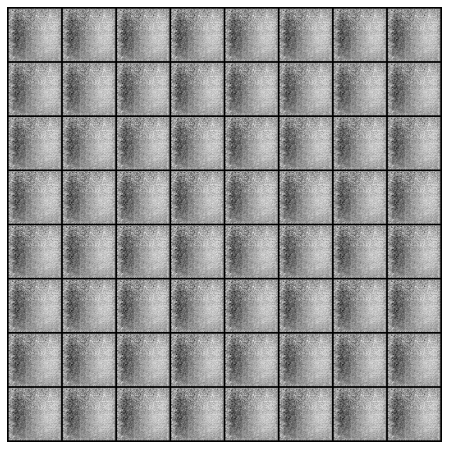

In [9]:
animate_gen_imgs()

# Trian : izif E

In [10]:
DC.eval()
D.eval()

kappa = 1.0
EC_losses = []

iters = 0
AE_img_list = []

def train_AE(epoch):
    global epochs
    global iters
    global EC_losses
    global AE_img_list
    
    # 인덱스 0부터 세기 시작
    # data[0].size():64x1x64x64(image) / data[1].size():64(label)
    for i,data in enumerate(data_loader,0):
        
        real_imgs = data[0].to(device)
        
        EC_optimizer.zero_grad()
        
        EC_validity = EC(real_imgs)
        
        fake_imgs = DC(EC_validity)
        
        _, real_features = D.forward(real_imgs)
        _, fake_features = D.forward(fake_imgs)
        
        
        # izif architecture
        imgs_loss = AE_criterion(real_imgs, fake_imgs)
        features_loss = AE_criterion(real_features, fake_features)
        EC_loss = imgs_loss + kappa*features_loss
        
        EC_loss.backward()
        EC_optimizer.step()
        
        # =============================================================
        # print
        # =============================================================
        print('[%d/%d][%d/%d]\n- E_loss: %.4f\n'
              %(epoch+1, epochs, i, len(data_loader), EC_loss.item()))
        
        # Save Losses for plotting later
        EC_losses.append(EC_loss.item())
        
        #Check how the generator is doing by saving G's output on noise_z
        if (iters % 500 == 0) or ((epoch == epochs-1) and (i == len(data_loader)-1)):
            with torch.no_grad():
                fake = DC(EC_validity).detach().cpu()
            AE_img_list.append(vutils.make_grid(fake, padding=2, normalize=True))
            
        iters += 1
        
#torch.save(E.state_dict(), 'E.ckpt')

In [11]:
for epoch in range(epochs):
    train_AE(epoch)

[1/100][0/2]
- E_loss: 0.2633

[1/100][1/2]
- E_loss: 0.2598

[2/100][0/2]
- E_loss: 0.2860

[2/100][1/2]
- E_loss: 0.2229

[3/100][0/2]
- E_loss: 0.2840

[3/100][1/2]
- E_loss: 0.2482

[4/100][0/2]
- E_loss: 0.2511

[4/100][1/2]
- E_loss: 0.2696

[5/100][0/2]
- E_loss: 0.2220

[5/100][1/2]
- E_loss: 0.2992

[6/100][0/2]
- E_loss: 0.2152

[6/100][1/2]
- E_loss: 0.3220

[7/100][0/2]
- E_loss: 0.2534

[7/100][1/2]
- E_loss: 0.2707

[8/100][0/2]
- E_loss: 0.2510

[8/100][1/2]
- E_loss: 0.2716

[9/100][0/2]
- E_loss: 0.2512

[9/100][1/2]
- E_loss: 0.2766

[10/100][0/2]
- E_loss: 0.2620

[10/100][1/2]
- E_loss: 0.2730

[11/100][0/2]
- E_loss: 0.2409

[11/100][1/2]
- E_loss: 0.2800

[12/100][0/2]
- E_loss: 0.2863

[12/100][1/2]
- E_loss: 0.2234

[13/100][0/2]
- E_loss: 0.2503

[13/100][1/2]
- E_loss: 0.2858

[14/100][0/2]
- E_loss: 0.2554

[14/100][1/2]
- E_loss: 0.2674

[15/100][0/2]
- E_loss: 0.2652

[15/100][1/2]
- E_loss: 0.2641

[16/100][0/2]
- E_loss: 0.2419

[16/100][1/2]
- E_loss: 0.

# Loss Graph

In [12]:
def plot_train_loss():
    plt.figure(figsize=(10,5))
    plt.title("Generator and Discriminator Loss During Training")
    plt.plot(DC_losses, label="G")
    plt.plot(D_losses, label="D")
    plt.plot(EC_losses, label="E")
    plt.xlabel("iterations")
    plt.ylabel("Loss")
    plt.legend()
    plt.show()

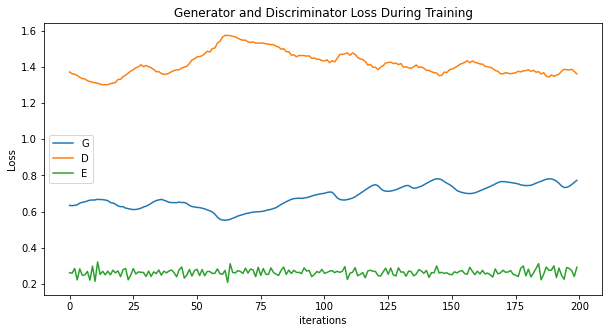

In [13]:
plot_train_loss()

---

# Test Data

In [14]:
#test_data_root = "../../dataset/test/test_DualPhaseSteel"
CFRP_test_data_root = "../../dataset/test/test_CFRP"

test_data_set = dataset.ImageFolder(root = CFRP_test_data_root, #test_data_root,
                           transform = transforms.Compose([
                                  transforms.Resize(img_size),
                                  transforms.CenterCrop(img_size),
                                  torchvision.transforms.Grayscale(channel),
                                  transforms.ToTensor(),
                                  transforms.Normalize((0.5,),(0.5,))
                              ]))

# 배치로 나누고 셔플하기
test_data_loader = torch.utils.data.DataLoader(test_data_set, batch_size = 1,
                                              shuffle = False, num_workers = workers)

# 이상 픽셀 수 확인 함수

In [15]:
def count_el_not_0(diff_img):
    count_el_not_0 = 0
    
    col_size = diff_img.shape[0]
    row_size = diff_img.shape[1]
    
    #print(col_size, row_size)
    
    for col in range(col_size):
        for row in range(row_size):
            if diff_img[col][row] != 0:
                count_el_not_0 += 1
                
    return count_el_not_0

# img 비교 함수

In [16]:
def compare_imgs(real_img, generated_img, i, score, reverse=False, threshold=50):
    real_img = real_img.cpu().data.numpy().reshape(img_size, img_size) * 255
    generated_img = generated_img.cpu().data.numpy().reshape(img_size, img_size) * 255
    
    negative = np.zeros_like(real_img)

    if not reverse:
        diff_img = real_img - generated_img
    else:
        diff_img = generated_img - real_img

    diff_img[diff_img <= threshold] = 0

    # 분율 추출
    diff_cnts.append(count_el_not_0(diff_img))
    # 분산 추출
    diff_points.append(np.where(diff_img > threshold))
    
    anomaly_img = np.zeros(shape=(img_size, img_size, 3))
    anomaly_img[:, :, 0] = real_img - diff_img
    anomaly_img[:, :, 1] = real_img - diff_img
    anomaly_img[:, :, 2] = real_img - diff_img
    anomaly_img[:, :, 0] = anomaly_img[:,:,0] + diff_img
    anomaly_img = anomaly_img.astype(np.uint8)

    # anomaly_img 추출
    anomaly_imgs.append(anomaly_img)
    
    fig, plots = plt.subplots(1, 4)

    fig.suptitle(f'Anomaly - (anomaly score: {score:.4})')
    
    fig.set_figwidth(9)
    fig.set_tight_layout(True)
    plots = plots.reshape(-1)
    plots[0].imshow(real_img, cmap='gray', label = "real")
    plots[1].imshow(generated_img, cmap='gray')
    plots[2].imshow(diff_img, cmap='gray')
    plots[3].imshow(anomaly_img)
    
    plots[0].set_title('real')
    plots[1].set_title('generated')
    plots[2].set_title('difference')
    plots[3].set_title('Anomaly Detection')
    plt.show()

# Test

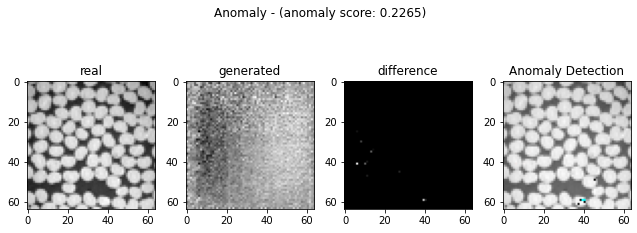

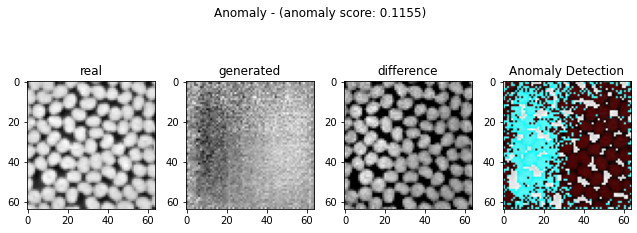

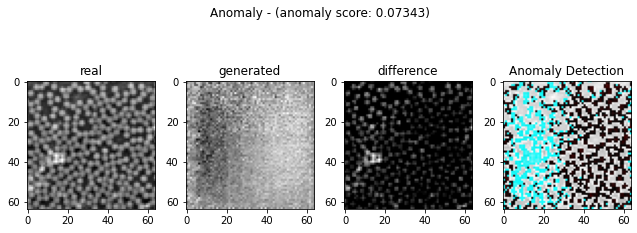

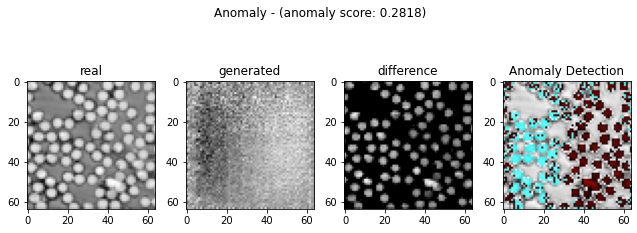

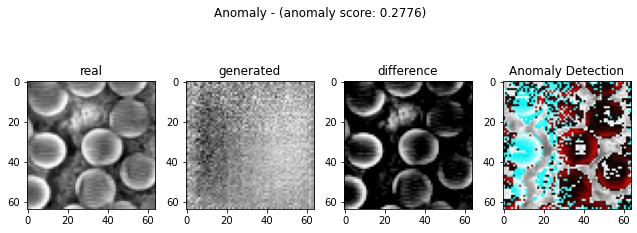

...

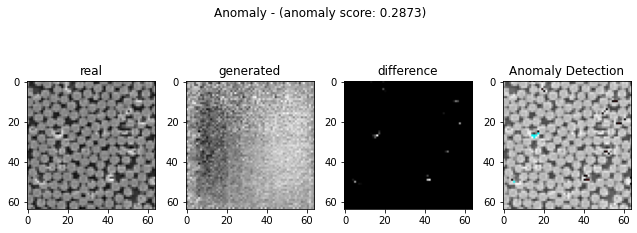

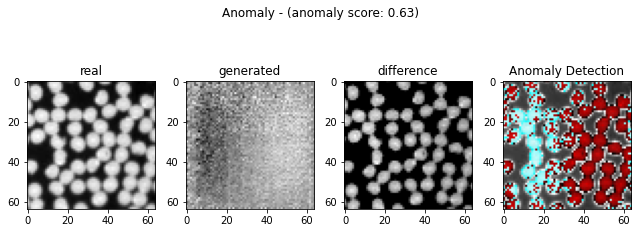

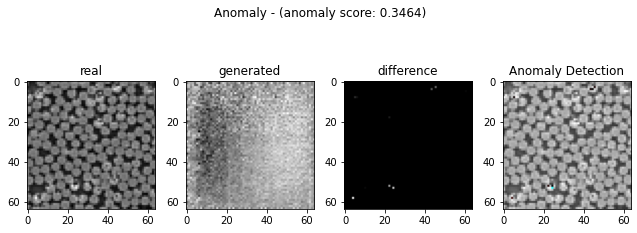

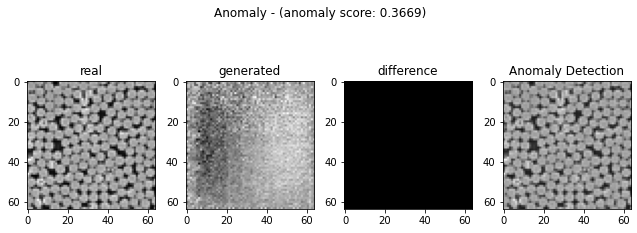

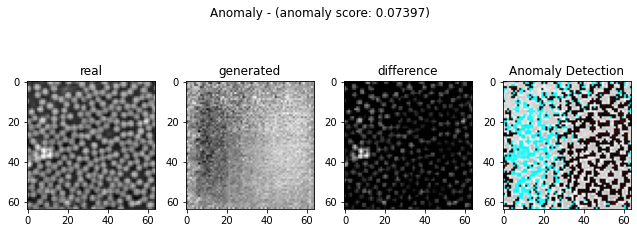

In [17]:
diff_cnts = []
diff_points = []
anomaly_imgs = []

ano_criterion = nn.MSELoss()
DC.eval()
D.eval()
EC.eval()

# with open("score.csv", "w") as f:
#         f.write("label,img_distance,anomaly_score,z_distance\n")

for i, data in enumerate(test_data_loader, 0):
    real_img = data[0].to(device)

    real_z = EC(real_img) # 진짜 이미지의 latent vector
    fake_img = DC(real_z) # DC에 넣어서 가짜 이미지 생성.
    fake_z = EC(fake_img) # torch.Size([1, 100]) --> latent 진짜 이미지와 매핑된 가짜 이미지의 latent vector

    _, real_feature = D.forward(real_img) # 1, 256
    _, fake_feature = D.forward(fake_img)

    img_distance = ano_criterion(fake_img, real_img)
    loss_feature = ano_criterion(fake_feature, real_feature)

    anomaly_score = img_distance + kappa*loss_feature

    z_distance = ano_criterion(fake_z, real_z)
    
#     with open("score.csv", "a") as f:
#             f.write(f"{label.item()},{img_distance},"
#                     f"{anomaly_score},{z_distance}\n")
            
#     print(f"{label.item()}, {img_distance}, "
#           f"{anomaly_score}, {z_distance}\n")
    compare_imgs(real_img, fake_img, i, anomaly_score, reverse = False, threshold = 0.3)

---

# 분율 추출

In [18]:
diff_cnts = np.array(diff_cnts)

diff_fraction = diff_cnts / img_size ** 2

print(diff_fraction)

[2.68554688e-03 8.40087891e-01 4.43359375e-01 3.65478516e-01
 6.34521484e-01 2.67822266e-01 6.11328125e-01 7.02880859e-01
 3.65966797e-01 6.34521484e-01 1.07421875e-01 0.00000000e+00
 4.28466797e-01 5.52734375e-01 6.54785156e-01 1.67968750e-01
 1.38183594e-01 1.52587891e-01 2.21435547e-01 4.81201172e-01
 2.13378906e-01 3.92822266e-01 5.86914062e-01 5.02929688e-02
 6.44042969e-01 3.69628906e-01 6.93359375e-01 6.41357422e-01
 7.30224609e-01 4.84130859e-01 4.40917969e-01 4.48974609e-01
 5.90332031e-01 2.74414062e-01 7.45605469e-01 4.17480469e-01
 5.99609375e-01 1.22070312e-03 4.70458984e-01 4.68017578e-01
 2.92968750e-03 5.76416016e-01 2.81250000e-01 0.00000000e+00
 5.21972656e-01 6.22802734e-01 7.32421875e-03 5.15869141e-01
 7.32421875e-04 6.56005859e-01 8.83544922e-01 4.88281250e-04
 0.00000000e+00 3.86474609e-01 7.08984375e-01 6.59179688e-03
 5.35156250e-01 2.68554688e-03 0.00000000e+00 4.54833984e-01]


In [19]:
sum(diff_fraction) / len(diff_fraction)

0.3866780598958333

---

# 분산 추출

In [20]:
from scipy import stats
from extended_int import int_inf

corr_coeffis = []
corr_p_vals = []

def cal_corr_coeffis():
    for idx in range(len(test_data_loader)):
        x_points = diff_points[idx][0]
        y_points = diff_points[idx][1]
        
        
        if len(x_points) > 0:
            corr_coeffi, corr_p_val = stats.pearsonr(x_points, y_points)
        else:
            corr_coeffi, corr_p_val = -int_inf, -int_inf
        
        corr_coeffis.append(corr_coeffi)
        corr_p_vals.append(corr_p_val)

In [21]:
cal_corr_coeffis()

print(corr_coeffis)

[0.8420398118978265, 0.014545424507737154, -0.06386053244135319, -0.030273457964034144, 0.030880262330579104, 0.03550693135008509, -0.0021587239213201716, -0.018114705147147303, -0.008699966014673592, 0.02398814622347698, -0.2849219024660027, -inf, 0.013233757467633674, 0.022153329231250046, 0.0685975077768474, -0.04595488269275419, 0.017980584587833706, -0.02965540668685817, 0.32123074892822123, 0.04199371864477638, 0.09563630241937762, 0.04031434656503298, -0.0010650995452992909, -0.3930233503624706, 0.017950936207652153, -0.04557509607725068, -0.02739601833902563, 0.028750420634227416, 0.0010322860868284662, -0.05704558679426906, 0.05163247779244692, -0.05296009552542062, -0.030371507611853973, 0.02390552529786485, -0.009543361743935205, 0.011213743241725756, 0.0013162763068963147, 0.6913057962292997, -0.015650785374540822, 0.04764302676167601, -0.9065945401869202, 0.019427771733949332, -0.053366538217602705, -inf, -0.018178381986108428, 0.024957519099449006, -0.1732008062268106, 0.

/home/piai/anaconda3/envs/pytorch/lib/python3.6/site-packages/scipy/stats/stats.py:3845: PearsonRConstantInputWarning: An input array is constant; the correlation coefficent is not defined.
  warnings.warn(PearsonRConstantInputWarning())


---

# 모델 저장 및 읽기

In [22]:
save_file = "./pretrained/pretrained.pth"

def save_pretrained():
    pretrained = {
        "D" : D.state_dict(),
        "DC" : DC.state_dict(),
        "EC" : EC.state_dict()
    }

    if not os.path.isdir("pretrained"):
        os.mkdir("pretrained")
    torch.save(pretrained, save_file)

In [23]:
save_pretrained()

In [24]:
pretrained_D = Discriminator().to(device)
pretrained_DC = Decoder().to(device)
pretrained_EC = Encoder().to(device)

def load_pretrained():
    global pretrained_D
    global pretrained_DC
    global pretrained_EC
    
    assert os.path.isdir("pretrained"), "Error : no pretrained dir found!"
    
    pretrained = torch.load(save_file)
    
    pretrained_D.load_state_dict(pretrained["D"])
    pretrained_DC.load_state_dict(pretrained["DC"])
    pretrained_EC.load_state_dict(pretrained["EC"])
    
    #print("pretrained_D :", pretrained_D)
    #print("pretrained_G :", pretrained_DC)
    #print("pretrained_E :", pretrained_EC)

In [25]:
load_pretrained()

In [26]:
def test():
    ano_criterion = nn.MSELoss()
    pretrained_DC.eval()
    pretrained_D.eval()
    pretrained_EC.eval()

    # with open("score.csv", "w") as f:
    #         f.write("label,img_distance,anomaly_score,z_distance\n")

    for i, data in enumerate(test_data_loader, 0):
        real_img = data[0].to(device)

        real_z = pretrained_EC(real_img) # 진짜 이미지의 latent vector
        fake_img = pretrained_DC(real_z) # DC에 넣어서 가짜 이미지 생성.
        fake_z = pretrained_EC(fake_img) # torch.Size([1, 100]) --> latent 진짜 이미지와 매핑된 가짜 이미지의 latent vector

        _, real_feature = pretrained_D.forward(real_img) # 1, 256
        _, fake_feature = pretrained_D.forward(fake_img)

        img_distance = ano_criterion(fake_img, real_img)
        loss_feature = ano_criterion(fake_feature, real_feature)

        anomaly_score = img_distance + kappa*loss_feature

        z_distance = ano_criterion(fake_z, real_z)

    #     with open("score.csv", "a") as f:
    #             f.write(f"{label.item()},{img_distance},"
    #                     f"{anomaly_score},{z_distance}\n")

    #     print(f"{label.item()}, {img_distance}, "
    #           f"{anomaly_score}, {z_distance}\n")
        compare_imgs(real_img, fake_img, i, anomaly_score, reverse = False, threshold = 0.3)

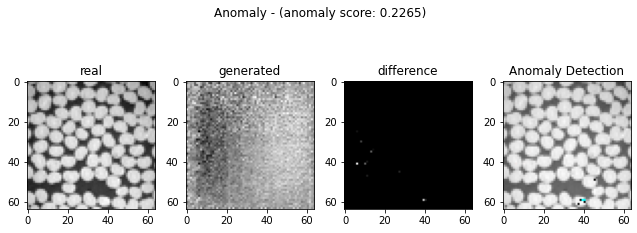

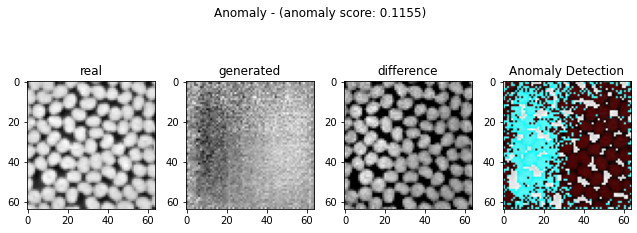

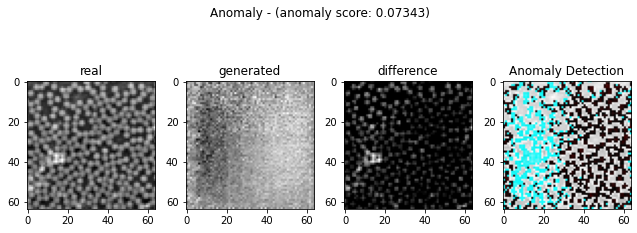

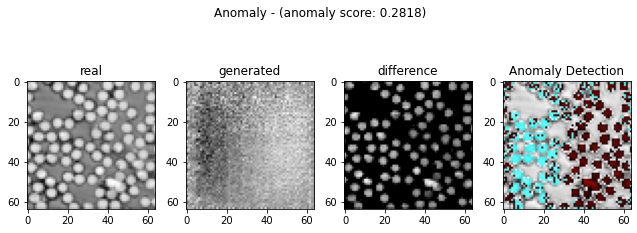

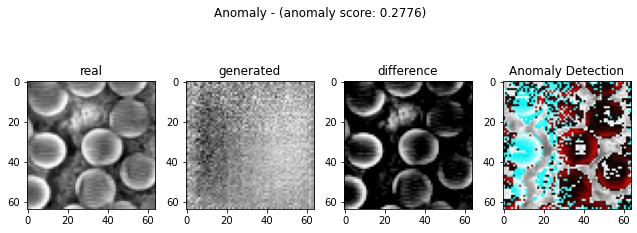

...

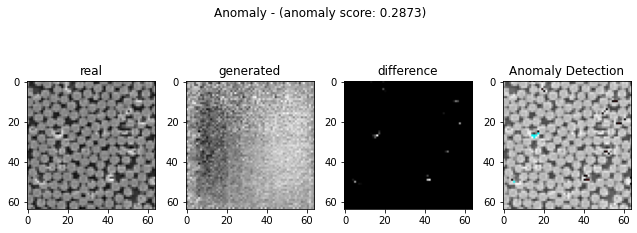

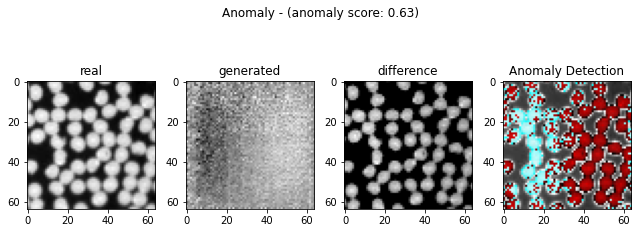

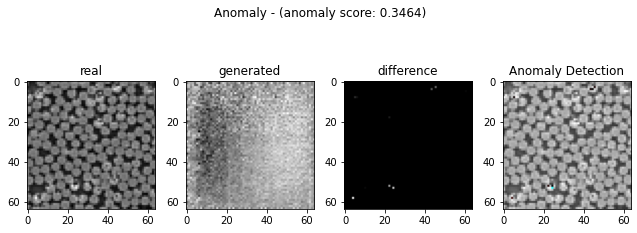

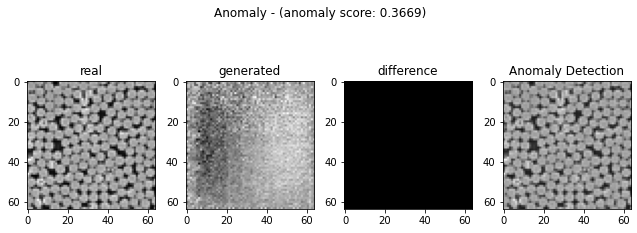

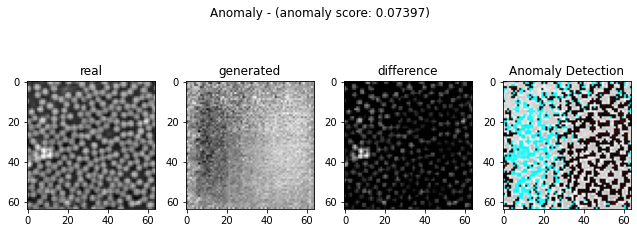

In [27]:
diff_cnts = []
diff_points = []
anomaly_imgs = []

corr_coeffis = []
corr_p_vals = []

test()

In [28]:
diff_cnts = np.array(diff_cnts)

diff_fraction = diff_cnts / img_size ** 2

print(diff_fraction)

[2.68554688e-03 8.40087891e-01 4.43359375e-01 3.65478516e-01
 6.34521484e-01 2.67822266e-01 6.11328125e-01 7.02880859e-01
 3.65966797e-01 6.34521484e-01 1.07421875e-01 0.00000000e+00
 4.28466797e-01 5.52734375e-01 6.54785156e-01 1.67968750e-01
 1.38183594e-01 1.52587891e-01 2.21435547e-01 4.81201172e-01
 2.13378906e-01 3.92822266e-01 5.86914062e-01 5.02929688e-02
 6.44042969e-01 3.69628906e-01 6.93359375e-01 6.41357422e-01
 7.30224609e-01 4.84130859e-01 4.40917969e-01 4.48974609e-01
 5.90332031e-01 2.74414062e-01 7.45605469e-01 4.17480469e-01
 5.99609375e-01 1.22070312e-03 4.70458984e-01 4.68017578e-01
 2.92968750e-03 5.76416016e-01 2.81250000e-01 0.00000000e+00
 5.21972656e-01 6.22802734e-01 7.32421875e-03 5.15869141e-01
 7.32421875e-04 6.56005859e-01 8.83544922e-01 4.88281250e-04
 0.00000000e+00 3.86474609e-01 7.08984375e-01 6.59179688e-03
 5.35156250e-01 2.68554688e-03 0.00000000e+00 4.54833984e-01]


In [29]:
cal_corr_coeffis()

print(corr_coeffis)

[0.8420398118978265, 0.014545424507737154, -0.06386053244135319, -0.030273457964034144, 0.030880262330579104, 0.03550693135008509, -0.0021587239213201716, -0.018114705147147303, -0.008699966014673592, 0.02398814622347698, -0.2849219024660027, -inf, 0.013233757467633674, 0.022153329231250046, 0.0685975077768474, -0.04595488269275419, 0.017980584587833706, -0.02965540668685817, 0.32123074892822123, 0.04199371864477638, 0.09563630241937762, 0.04031434656503298, -0.0010650995452992909, -0.3930233503624706, 0.017950936207652153, -0.04557509607725068, -0.02739601833902563, 0.028750420634227416, 0.0010322860868284662, -0.05704558679426906, 0.05163247779244692, -0.05296009552542062, -0.030371507611853973, 0.02390552529786485, -0.009543361743935205, 0.011213743241725756, 0.0013162763068963147, 0.6913057962292997, -0.015650785374540822, 0.04764302676167601, -0.9065945401869202, 0.019427771733949332, -0.053366538217602705, -inf, -0.018178381986108428, 0.024957519099449006, -0.1732008062268106, 0.

---

# anomaly detection 이미지 추출

In [30]:
anomaly_imgs

[array([[[188, 188, 188],
         [192, 192, 192],
         [194, 194, 194],
         ...,
         [180, 180, 180],
         [186, 186, 186],
         [186, 186, 186]],
 
        [[136, 136, 136],
         [180, 180, 180],
         [182, 182, 182],
         ...,
         [190, 190, 190],
         [184, 184, 184],
         [188, 188, 188]],
 
        [[186, 186, 186],
         [180, 180, 180],
         [127, 127, 127],
         ...,
         [188, 188, 188],
         [184, 184, 184],
         [190, 190, 190]],
 
        ...,
 
        [[180, 180, 180],
         [206, 206, 206],
         [206, 206, 206],
         ...,
         [226, 226, 226],
         [232, 232, 232],
         [150, 150, 150]],
 
        [[172, 172, 172],
         [113, 113, 113],
         [198, 198, 198],
         ...,
         [228, 228, 228],
         [218, 218, 218],
         [166, 166, 166]],
 
        [[188, 188, 188],
         [166, 166, 166],
         [222, 222, 222],
         ...,
         [226, 226, 226],
  

# 이미지 저장 함수

In [31]:
import cv2

def save_imgs(folder, imgs):
    if not os.path.isdir("anomaly_imgs"):
        os.mkdir("anomaly_imgs")
    
    for i in range(len(imgs)):
        cv2.imwrite('%s/%d.png' %(folder,i), imgs[i]) #이미지 저장할 경로 설정을 여기서 한다.
    print("image saving complete")

In [32]:
save_imgs("./anomaly_imgs", anomaly_imgs)

image saving complete


---

# 티타늄(Ti64) 상대 밀도 계산

In [33]:
Ti64_density = 4.43

Ti64_rel_densitys = np.array([])

Ti64_rel_densitys = diff_fraction * Ti64_density

print(Ti64_rel_densitys)

[1.18969727e-02 3.72158936e+00 1.96408203e+00 1.61906982e+00
 2.81093018e+00 1.18645264e+00 2.70818359e+00 3.11376221e+00
 1.62123291e+00 2.81093018e+00 4.75878906e-01 0.00000000e+00
 1.89810791e+00 2.44861328e+00 2.90069824e+00 7.44101562e-01
 6.12153320e-01 6.75964355e-01 9.80959473e-01 2.13172119e+00
 9.45268555e-01 1.74020264e+00 2.60002930e+00 2.22797852e-01
 2.85311035e+00 1.63745605e+00 3.07158203e+00 2.84121338e+00
 3.23489502e+00 2.14469971e+00 1.95326660e+00 1.98895752e+00
 2.61517090e+00 1.21565430e+00 3.30303223e+00 1.84943848e+00
 2.65626953e+00 5.40771484e-03 2.08413330e+00 2.07331787e+00
 1.29785156e-02 2.55352295e+00 1.24593750e+00 0.00000000e+00
 2.31233887e+00 2.75901611e+00 3.24462891e-02 2.28530029e+00
 3.24462891e-03 2.90610596e+00 3.91410400e+00 2.16308594e-03
 0.00000000e+00 1.71208252e+00 3.14080078e+00 2.92016602e-02
 2.37074219e+00 1.18969727e-02 0.00000000e+00 2.01491455e+00]
